<a href="https://colab.research.google.com/github/mjimenalopez24/ProyectoIA_UNALFaces/blob/main/VGGFace.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <center><font color=red> <b> <i> RECONOCIMIENTO FACIAL


<center> <img src="https://fotografias-compromiso.atresmedia.com/clipping/cmsimages02/2020/06/09/BEDF67B1-7050-4704-863E-BA0E902FA45D/58.jpg"width='700' height='350'> </center>

## <font color= blue> Autores

*  [Danna Gabriela Bustacara Rodríguez](link), dbustacara@unal.edu.co
* [Kevin Andrés Leal Pérez](linkedin.com/in/kevin-andres-leal-perez-2a958a254), klealp@unal.edu.co
* [María Jimena López Munevar](link), malopezmu@unal.edu.co

## <font color= blue> Descripción del modelo

El modelo que se emplea a continuación se conoce como **VGG Face Descriptor**, y fue construido por Omkar M. Parkhi, Andrea Vedaldi y Andrew Zisserman. En la imagen se presenta un poster publicado por los autores con aspectos importantes del modelo, en donde se observa que lo mas destacado es su entrenamiento con un alto número de imagenes.

Este método utiliza una CNN profunda entrenada para clasificar caras utilizando un conjunto de datos de 4 millones de ejemplos que abarcan 4000 identidades únicas. También utiliza una arquitectura de red siamesa, donde se aplica la misma CNN a pares de caras para obtener descriptores que luego se comparan utilizando la distancia euclidiana. El objetivo del entrenamiento es minimizar la distancia entre pares de rostros congruentes (es decir, representar la misma identidad) y maximizar la distancia entre pares incongruentes, una forma de aprendizaje métrico.

A continuación se presentan algunos detalles importantes que tiene la red:

* Núcleos de convolución de 3 x 3: Esto se refiere a los filtros que se aplican en la etapa de convolución de la CNN. Los núcleos de convolución de 3 x 3 son pequeños y se utilizan para extraer características locales de la imagen.

* Desplazamiento de convolución de 1 píxel: Especifica cómo se desplaza el filtro de convolución sobre la imagen de entrada. Un desplazamiento de 1 píxel significa que el filtro se desplaza de un píxel a la vez.

* No linealidad ReLU: ReLU (Rectified Linear Unit) es una función de activación, la cual aplica max(0, x) a la salida de la convolución para introducir no linealidad en la red.

* Sin normalización de contraste local: Normalmente, la normalización de contraste local se utiliza para mejorar la robustez de la red frente a variaciones de iluminación en las imágenes. En este caso, indica que no se está utilizando esta técnica específica.

* 3 capas completamente conectadas: Después de la etapa de convolución, las características extraídas se aplanan y se pasan a través de capas completamente conectadas. Estas capas finales procesan las características para producir las salidas deseadas.

* Inicialización aleatoria gaussiana: Se refiere al método utilizado para inicializar los pesos de la red neuronal. En este caso, los pesos se inicializan utilizando una distribución gaussiana aleatoria.

* Descenso de gradiente estocástico con retropropagación: Es un algoritmo de optimización utilizado para ajustar los pesos de la red neuronal durante el entrenamiento. El descenso de gradiente estocástico significa que los pesos se actualizan en cada paso utilizando solo una muestra aleatoria del conjunto de datos de entrenamiento, en lugar de utilizar todo el conjunto de datos a la vez. La retropropagación se refiere al algoritmo utilizado para calcular los gradientes y propagarlos hacia atrás a través de la red neuronal para actualizar los pesos.

* Descenso del acumulador para tamaños de lote grandes: Se refiere a una técnica utilizada para el descenso de gradiente estocástico con tamaños de lote grandes. En lugar de actualizar los pesos después de cada muestra, se acumulan los gradientes durante un número determinado de muestras y luego se realiza una actualización acumulada de los pesos.

* Tamaño de lote 256: Indica el número de muestras que se utilizan en cada paso de entrenamiento antes de actualizar los pesos. En este caso, se utilizan 256 muestras a la vez.

* Entrenamiento incremental de capas completamente conectadas: Se refiere a una técnica donde las capas completamente conectadas se entrenan de forma incremental, es decir, una capa a la vez, en lugar de entrenar todas las capas simultáneamente.

* Criterio de clasificación multinomial de 2622 clases: Indica el tipo de función de pérdida utilizada en el entrenamiento. En este caso, se utiliza un criterio multinomial para clasificar las muestras en 2622 clases distintas. Softmax es una función de activación, que produce un vector de la misma dimensión que el vector de puntuaciones de entrada, donde cada elemento representa la probabilidad de que la muestra pertenezca a la clase correspondiente. Estas probabilidades suman 1, lo que permite interpretar la salida como una distribución de probabilidad.

En la fase de pre-procesamiento, las imágenes de los rostros se alinean en una pose canónica utilizando un modelo 3D. La entrada es una imagen facial de tamaño 224 x 224 con la imagen promedio (calculada a partir del conjunto de entrenamiento) restada; esto es fundamental para la estabilidad del algoritmo de optimización.


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


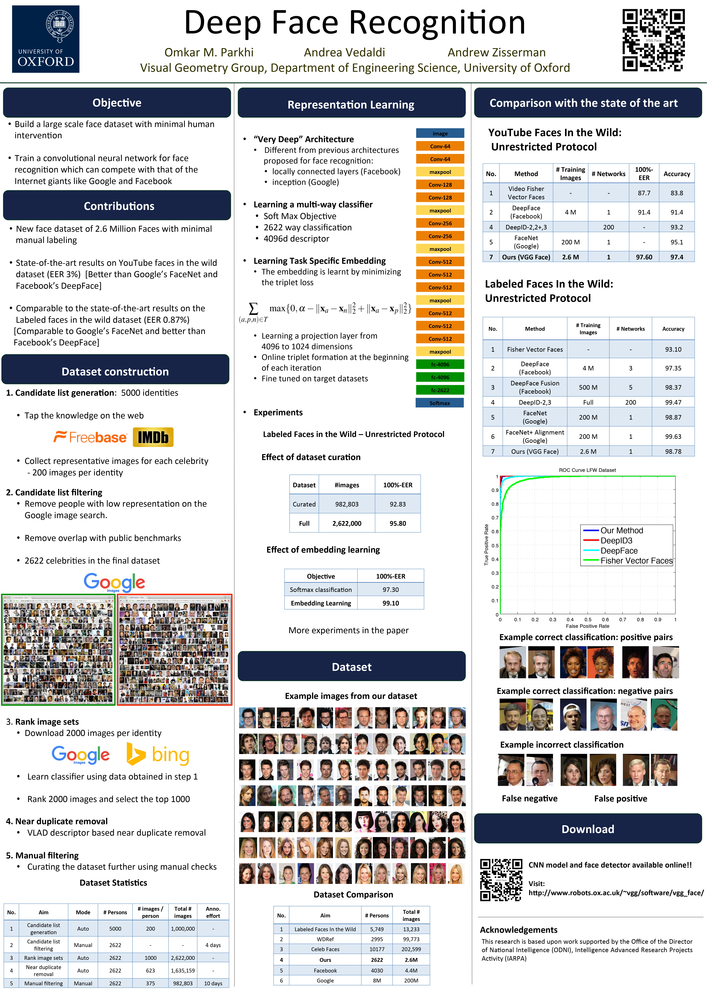

In [2]:
!pip install pillow
from PIL import Image

# Ruta de la imagen
ruta_imagen = "/content/drive/Shareddrives/Proyecto_Inteligencia_Artificial/vgg_face_torch/posterVGGFace.jpg"

# Abrir la imagen
poster = Image.open(ruta_imagen)

# Mostrar la imagen
poster.show()

## <font color= blue> Referencias


* [O. M. Parkhi, A. Vedaldi, A. Zisserman. Deep Face Recognition. British Machine Vision Conference, 2015](https://www.robots.ox.ac.uk/~vgg/publications/2015/Parkhi15/)
* [VGG Face descriptor](https://www.robots.ox.ac.uk/~vgg/software/vgg_face/)
* [VGG-Face Descriptor port to pytorch](https://github.com/prlz77/vgg-face.pytorch)
* [Tutorial: Reconocimiento Facial con Machine Learning en Python](https://www.codificandobits.com/blog/tutorial-reconocimiento-facial-python/)



## <font color= blue> Código

In [ ]:
## Librerias

## Modelo
import cv2
import torch
import torch.nn as nn
import torch.nn.functional as F
!pip install torchfile
import torchfile
# print(torch.__version__)

## Imagenes
import numpy as np
import matplotlib.pyplot as plt

## Deteccion de rostros
import tensorflow as tf

## Manejo de directorios
import os, sys

## embbeding en diccionario
import pickle

## <font color= blue> Modelo VGGFace

In [4]:
class VGG_16(nn.Module):
    """
    Main Class
    """

    def __init__(self):
        """
        Constructor
        """
        super().__init__()
        self.block_size = [2, 2, 3, 3, 3]
        self.conv_1_1 = nn.Conv2d(3, 64, 3, stride=1, padding=1)
        self.conv_1_2 = nn.Conv2d(64, 64, 3, stride=1, padding=1)
        self.conv_2_1 = nn.Conv2d(64, 128, 3, stride=1, padding=1)
        self.conv_2_2 = nn.Conv2d(128, 128, 3, stride=1, padding=1)
        self.conv_3_1 = nn.Conv2d(128, 256, 3, stride=1, padding=1)
        self.conv_3_2 = nn.Conv2d(256, 256, 3, stride=1, padding=1)
        self.conv_3_3 = nn.Conv2d(256, 256, 3, stride=1, padding=1)
        self.conv_4_1 = nn.Conv2d(256, 512, 3, stride=1, padding=1)
        self.conv_4_2 = nn.Conv2d(512, 512, 3, stride=1, padding=1)
        self.conv_4_3 = nn.Conv2d(512, 512, 3, stride=1, padding=1)
        self.conv_5_1 = nn.Conv2d(512, 512, 3, stride=1, padding=1)
        self.conv_5_2 = nn.Conv2d(512, 512, 3, stride=1, padding=1)
        self.conv_5_3 = nn.Conv2d(512, 512, 3, stride=1, padding=1)
        self.fc6 = nn.Linear(512 * 7 * 7, 4096)
        self.fc7 = nn.Linear(4096, 4096)
        self.fc8 = nn.Linear(4096, 2622)

    def load_weights(self, path="/content/drive/Shareddrives/Proyecto_Inteligencia_Artificial/vgg_face_torch/VGG_FACE.t7"):
        """ Function to load luatorch pretrained

        Args:
            path: path for the luatorch pretrained
        """
        model = torchfile.load(path)
        counter = 1
        block = 1
        for i, layer in enumerate(model.modules):
            if layer.weight is not None:
                if block <= 5:
                    self_layer = getattr(self, "conv_%d_%d" % (block, counter))
                    counter += 1
                    if counter > self.block_size[block - 1]:
                        counter = 1
                        block += 1
                    self_layer.weight.data[...] = torch.tensor(layer.weight).view_as(self_layer.weight)[...]
                    self_layer.bias.data[...] = torch.tensor(layer.bias).view_as(self_layer.bias)[...]
                else:
                    self_layer = getattr(self, "fc%d" % (block))
                    block += 1
                    self_layer.weight.data[...] = torch.tensor(layer.weight).view_as(self_layer.weight)[...]
                    self_layer.bias.data[...] = torch.tensor(layer.bias).view_as(self_layer.bias)[...]

    def forward(self, x):
        """ Pytorch forward

        Args:
            x: input image (224x224)

        Returns: class logits

        """
        x = F.relu(self.conv_1_1(x))
        x = F.relu(self.conv_1_2(x))
        x = F.max_pool2d(x, 2, 2)
        x = F.relu(self.conv_2_1(x))
        x = F.relu(self.conv_2_2(x))
        x = F.max_pool2d(x, 2, 2)
        x = F.relu(self.conv_3_1(x))
        x = F.relu(self.conv_3_2(x))
        x = F.relu(self.conv_3_3(x))
        x = F.max_pool2d(x, 2, 2)
        x = F.relu(self.conv_4_1(x))
        x = F.relu(self.conv_4_2(x))
        x = F.relu(self.conv_4_3(x))
        x = F.max_pool2d(x, 2, 2)
        x = F.relu(self.conv_5_1(x))
        x = F.relu(self.conv_5_2(x))
        x = F.relu(self.conv_5_3(x))
        x = F.max_pool2d(x, 2, 2)
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc6(x))
        x = F.dropout(x, 0.5, self.training)
        x = F.relu(self.fc7(x))
        x = F.dropout(x, 0.5, self.training)
        return self.fc8(x)

## <font color= blue> Cargar el modelo y los pesos

Cargamos el modelo, sus pesos y calculamos lo embeddings de una imagen de prueba tras haberle aplicado la transformación adecuada para que coincida con la entrada que recibe el modelo.

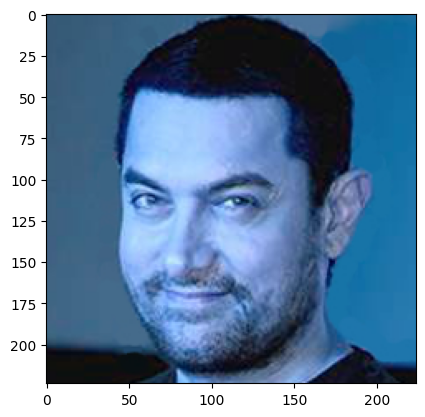

In [5]:
# if __name__ == "__main__" se utiliza para comprobar si el módulo actual está siendo ejecutado directamente
# como un programa principal, en lugar de ser importado como un módulo en otro programa
if __name__ == "__main__":
    model = VGG_16().double()
    model.load_weights()
    imo = cv2.imread("/content/drive/Shareddrives/Proyecto_Inteligencia_Artificial/vgg_face_torch/ak.png")
    plt.imshow(imo) # imo.shape = (224, 224, 3)

    im = torch.Tensor(imo).permute(2, 0, 1).view(1, 3, 224, 224).double()

    model.eval()
    im -= torch.Tensor(np.array([129.1863, 104.7624, 93.5940])).double().view(1, 3, 1, 1)
    preds = F.softmax(model(im), dim=1)
    values, indices = preds.max(-1)

Verificamos el estado actual del modelo para asegurarnos de que los pesos fueron cargados correctamente.

In [ ]:
# Estado del modelo
model.state_dict()

In [ ]:
# Dimensiones
preds.shape

torch.Size([1, 2622])

## <font color= blue> Detección de rostros

Para esta tarea haremos uso de MobileNet, una Red Convolucional especializada en la detección de objetos y optimizada para ejecución en dispositivos móviles, y que en este caso ha sido entrenada específicamente para la detección de rostros.

Este modelo pre-entrenado está almacenado en un formato de grafo de TensorFlow. Para realizar la lectura usaremos las funciones io.gfile y import_graph_def de TensorFlow, y el modelo será almacenado en la variable mobilenet.

Luego, implementaremos la función encargada de realizar la detección. Esta función tendrá como entradas la imagen original y un umbral (score_threshold). Este umbral se requiere pues MobileNet detecta múltiples regiones de interés para el mismo rostro, algunas de las cuales probablemente no corresponden a un rostro. Cada una de estas regiones de interés tendrá un puntaje entre 0 y 1 que nos indicará la probabilidad de que la región pertenezca o no a un rostro: 0 indica una baja probabilidad y 1 total certeza de que la región contiene un rostro.

Así que las regiones de interés y los puntajes correspondientes serán almacenados en las variables boxes y scores respectivamente, y tomaremos las regiones de interés con un umbral mayor o igual a 0.7 (es decir con un 70% de probabilidad de que contengan un rostro). Estas regiones seleccionadas serán almacenadas en la variable bboxes que contendrá las coordenadas dentro de la imagen de la esquina superior izquierda (left, top) y de la esquina inferior derecha (right, bottom) de cada region detectada:

In [6]:
def load_image(DIR, NAME):
    return cv2.cvtColor(cv2.imread(f'{DIR}/{NAME}'), cv2.COLOR_BGR2RGB)

In [7]:
with tf.io.gfile.GFile('/content/drive/Shareddrives/Proyecto_Inteligencia_Artificial/Modelos/frozen_inference_graph_face.pb','rb') as f:
    graph_def = tf.compat.v1.GraphDef()
    graph_def.ParseFromString(f.read())

with tf.Graph().as_default() as mobilenet:
    tf.import_graph_def(graph_def,name='')

In [8]:
def detect_faces(image, score_threshold=0.7):
    global boxes, scores
    (imh, imw) = image.shape[:-1]
    img = np.expand_dims(image,axis=0)

    # Inicializar mobilenet
    sess = tf.compat.v1.Session(graph=mobilenet)
    image_tensor = mobilenet.get_tensor_by_name('image_tensor:0')
    boxes = mobilenet.get_tensor_by_name('detection_boxes:0')
    scores = mobilenet.get_tensor_by_name('detection_scores:0')

    # Predicción (detección)
    (boxes, scores) = sess.run([boxes, scores], feed_dict={image_tensor:img})

    # Reajustar tamaños boxes, scores
    boxes = np.squeeze(boxes,axis=0)
    scores = np.squeeze(scores,axis=0)

    # Depurar bounding boxes
    idx = np.where(scores>=score_threshold)[0]

    # Crear bounding boxes
    bboxes = []
    for index in idx:
        ymin, xmin, ymax, xmax = boxes[index,:]
        (left, right, top, bottom) = (xmin*imw, xmax*imw, ymin*imh, ymax*imh)
        left, right, top, bottom = int(left), int(right), int(top), int(bottom)
        bboxes.append([left,right,top,bottom])

    return bboxes

La siguiente función se encargará de extraer la porción de la imágen que contiene el rostro y luego redimensionarla al tamaño [224x224]

In [9]:
def extract_faces(image,bboxes,new_size=(224,224)):
    cropped_faces = []
    for box in bboxes:
        left, right, top, bottom = box
        face = image[top:bottom,left:right]
        cropped_faces.append(cv2.resize(face,dsize=new_size))
    return cropped_faces

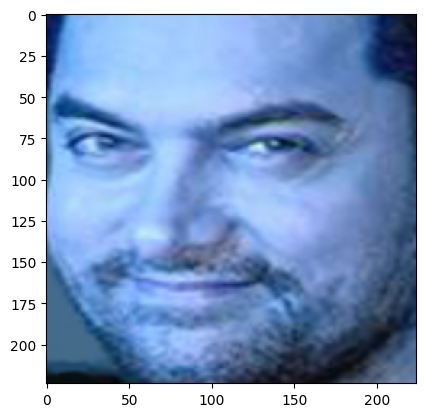

In [10]:
bboxes = detect_faces(imo)
faces = extract_faces(imo,bboxes)
plt.imshow(faces[0])

In [11]:
faces[0].shape

(224, 224, 3)

---

La siguiente función tiene como entrada el modelo que se implementará para obtener el embedding de un rostro, y la imágen a la cual se le quiere obtener este vector. La salida será el embedding.

In [13]:
def compute_embedding(model,face):
    face = torch.Tensor(face).permute(2, 0, 1).view(1, 3, 224, 224).double()
    face -= torch.Tensor(np.array([129.1863, 104.7624, 93.5940])).double().view(1, 3, 1, 1)
    preds = F.softmax(model(face), dim=1).detach().numpy()
    return preds

embedding = compute_embedding(model,faces[0])
print(embedding)

[[9.80879677e-05 1.10128358e-03 3.22578722e-01 ... 6.43070448e-08
  1.35031123e-05 7.21533932e-07]]


## <font color= blue> Prueba

A continuación cargamos unos directorios de prueba, calculamos los embeddings de los rostros de training y clasificamos los rostros de las imagenes test

In [14]:
DIR_KNOWNS = '/content/drive/Shareddrives/Proyecto_Inteligencia_Artificial/Img_Prueba/Known/'
DIR_UNKNOWNS = '/content/drive/Shareddrives/Proyecto_Inteligencia_Artificial/Img_Prueba/Unknown/'
DIR_RESULTS = '/content/drive/Shareddrives/Proyecto_Inteligencia_Artificial/Img_Prueba/Results'

In [15]:
known_embeddings = []

print('Procesando rostros conocidos...')
for name in os.listdir(DIR_KNOWNS):
    if name.endswith('.jpg'):
        print(f'   {name}')
        image = load_image(DIR_KNOWNS,name)
        bboxes = detect_faces(image)
        face = extract_faces(image,bboxes)
        known_embeddings.append(compute_embedding(model,face[0]))

Procesando rostros conocidos...
   Kevin_001.jpg
   Kevin_003.jpg
   Kevin_004.jpg
   Kevin_005.jpg


In [16]:
known_embeddings[0].shape

(1, 2622)

In [17]:
def draw_box(image,box,color,line_width=6):
    if box==[]:
        return image
    else:
        cv2.rectangle(image,(box[0],box[2]),(box[1],box[3]),color,line_width)
    return image

In [18]:
def compare_faces(embs_ref, emb_desc, umbral=0.06):
    distancias = []
    for emb_ref in embs_ref:
        distancias.append(np.linalg.norm(emb_ref-emb_desc))
    distancias = np.array(distancias)
    return distancias, list(distancias<=umbral)

In [19]:
print('Procesando imágenes desconocidas...')
for name in os.listdir(DIR_UNKNOWNS):
    if name.endswith('.jpg'):
        print(f'   {name}')
        image = load_image(DIR_UNKNOWNS,name)
        bboxes = detect_faces(image)
        faces = extract_faces(image,bboxes)

        # Por cada rostro calcular embedding
        img_with_boxes = image.copy()
        for face, box in zip(faces,bboxes):
            emb = compute_embedding(model,face)
            print(emb)

            _, reconocimiento = compare_faces(known_embeddings,emb)

            if any(reconocimiento):
                print('     La cara coincide!')
                img_with_boxes = draw_box(img_with_boxes,box,(0,255,0))
            else:
                print('     Esta cara no existe en el registro')
                img_with_boxes = draw_box(img_with_boxes,box,(255,0,0))

        cv2.imwrite(f'{DIR_RESULTS}/{name}',cv2.cvtColor(img_with_boxes,cv2.COLOR_RGB2BGR))
print('¡Fin!')

Procesando imágenes desconocidas...
   Kevin_007.jpg
[[1.62735492e-03 1.09506104e-03 3.53967246e-04 ... 7.70861468e-06
  1.98956359e-04 1.05671474e-04]]
     La cara coincide!
   TWD.jpg
[[4.85931392e-05 1.64424880e-05 2.41929806e-04 ... 3.14390615e-06
  9.05016377e-04 4.06086406e-04]]
     Esta cara no existe en el registro
[[2.13758124e-05 3.64683756e-07 1.18480966e-06 ... 1.45540079e-08
  5.45388100e-06 8.99098788e-06]]
     Esta cara no existe en el registro
[[2.65616089e-03 5.27206553e-05 9.27306820e-05 ... 2.23688564e-06
  4.84965673e-05 2.40959468e-04]]
     Esta cara no existe en el registro
   jimena_001.jpg
[[9.11456435e-04 4.50683129e-04 4.23556864e-04 ... 3.19406182e-07
  1.39872641e-04 1.56463689e-03]]
     Esta cara no existe en el registro
   Kevin_006.jpg
[[3.09660066e-03 7.39272005e-05 4.06569250e-05 ... 3.42730271e-06
  9.59312224e-05 1.20088662e-04]]
     Esta cara no existe en el registro
   Danna.jpg
[[2.13926730e-03 4.57181653e-04 2.66944258e-03 ... 1.87789117e-06

In [ ]:
print(known_embeddings)

[array([[7.27212828e-04, 1.21704383e-03, 1.10706681e-04, ...,
        4.60450622e-07, 5.19040421e-04, 5.92272864e-04]]), array([[9.79824840e-04, 5.22065821e-04, 1.36617485e-03, ...,
        7.35542089e-05, 1.27222117e-03, 5.28672404e-04]]), array([[1.12010160e-03, 3.69437305e-04, 2.26946045e-04, ...,
        4.67386260e-06, 5.67565470e-04, 1.97950540e-04]]), array([[3.00504232e-03, 9.73119296e-04, 4.75858866e-04, ...,
        5.60656165e-06, 4.96917171e-04, 5.15078151e-04]]), array([[1.02623532e-03, 2.13193593e-03, 3.54463422e-04, ...,
        1.93893427e-06, 2.60552971e-04, 1.40069590e-04]])]


## <font color= blue> Embeddings para los datos de training

Ahora, realizaremos este mismo procedimiento para las imágenes de training que descargamos de la plataforma kaggle.

Cargamos los directorios

In [20]:
DIR_KNOWNS = '/content/drive/Shareddrives/Proyecto_Inteligencia_Artificial/Datos/Train1000'
DIR_UNKNOWNS =  '/content/drive/Shareddrives/Proyecto_Inteligencia_Artificial/Datos/Dev1000'
DIR_RESULTS = '/content/drive/Shareddrives/Proyecto_Inteligencia_Artificial/Datos/Results'

Leemos los directorios

In [22]:
carpetas_train = os.listdir(DIR_KNOWNS)
print(len(carpetas_train))
carpetas_dev = os.listdir(DIR_UNKNOWNS)
print(len(carpetas_dev))

500
500


Calculamos los embeddings para los rostros de cada imagen en cada carpeta de train.

```
known_faces = dict()
cont = 0
print('Procesando rostros conocidos...')
for label in carpetas_train[105:106]:
    # Se crea una lista que será el valor de cada carpeta en el diccionario
    known_embeddings = []
    image_path = os.path.join(DIR_KNOWNS, label)
    cont = cont+1
    print('Procesando carpeta número '+str(cont)+'. Nombre:' + label)
    for image_name in os.listdir(os.path.join(DIR_KNOWNS, label)):
        image = load_image(image_path,image_name)
        bboxes = detect_faces(image)
        # condicional para que se guarde solo si puedo identificar la imagen
        if bboxes != []:
            face = extract_faces(image,bboxes)
            known_embeddings.append(compute_embedding(model,face[0]))
    known_faces[label] = known_embeddings
```

Guardamos los embeddings en un diccionario con ayuda del módilo pickle para evitar calcularlos varias veces.

```
# Guardar el diccionario en un archivo
with open('/content/drive/Shareddrives/Proyecto_Inteligencia_Artificial/Modelos/DiccionarioTrainVGG.pickle', 'wb') as archivo:
    pickle.dump(known_faces, archivo)
```

Se importa el diccionario para los embeddings de train

In [26]:
# Cargar el diccionario desde el archivo
with open('/content/drive/Shareddrives/Proyecto_Inteligencia_Artificial/Modelos/DiccionarioTrainVGG.pickle', 'rb') as archivo:
    known_faces= pickle.load(archivo)

In [ ]:
len(set(known_faces))

500

## <font color= blue> Embeddings para los datos de test

Calculamos los embeddings para los rostros de cada imagen en cada carpeta de test.

```
unknown_faces = dict()
cont = 0
print('Procesando rostros desconocidos...')
for label in carpetas_dev[300:500]:
    # Se crea una lista que será el valor de cada carpeta en el diccionario
    known_embeddings = []
    image_path = os.path.join(DIR_UNKNOWNS, label)
    cont = cont+1
    print('Procesando carpeta número '+str(cont)+'. Nombre:' + label)
    for image_name in os.listdir(os.path.join(DIR_UNKNOWNS, label)):
        image = load_image(image_path,image_name)
        bboxes = detect_faces(image)
        # condicional para que se guarde solo si puedo identificar la imagen
        if bboxes != []:
            face = extract_faces(image,bboxes)
            known_embeddings.append(compute_embedding(model,face[0]))
    unknown_faces[label] = known_embeddings

```

Guardamos los embeddings en un diccionario con ayuda del módilo pickle para evitar calcularlos varias veces.

```
# Guardar el diccionario en un archivo
with open('/content/drive/Shareddrives/Proyecto_Inteligencia_Artificial/Modelos/DiccionarioTestVGG.pickle', 'wb') as archivo:
    pickle.dump(unknown_faces, archivo)
```

In [27]:
# Cargar el diccionario desde el archivo
with open('/content/drive/Shareddrives/Proyecto_Inteligencia_Artificial/Modelos/DiccionarioTestVGG.pickle', 'rb') as archivo:
    unknown_faces = pickle.load(archivo)

keys_dict = unknown_faces.keys()
len(unknown_faces)

500

El siguiente códico nos permite verificar que efectivamente se estan eligiendo carpetas (individuos) con la misma cantidad de imagenes para ambos conjuntos.

In [ ]:
def contar_archivos_en_carpeta(carpeta):
    contador = 0
    # Obtener la lista de archivos y carpetas en la carpeta
    contenido = os.listdir(carpeta)

    # Recorrer los elementos y contar los archivos
    for elemento in contenido:
        ruta_completa = os.path.join(carpeta, elemento)
        if os.path.isfile(ruta_completa):
            contador += 1

    return contador

cantidad_archivos=[]
# Iterar sobre los archivos
for label in carpetas_train:
    # Ruta completa del archivo
    ruta_archivo = os.path.join(DIR_KNOWNS, label)
    cantidad_archivos=contar_archivos_en_carpeta(ruta_archivo)
    print(label,cantidad_archivos,end="\n ")
cantidad_archivos=[]
# Iterar sobre los archivos
for label in carpetas_dev:
    # Ruta completa del archivo
    ruta_archivo = os.path.join(DIR_UNKNOWNS, label)
    cantidad_archivos=contar_archivos_en_carpeta(ruta_archivo)
    print(label,cantidad_archivos,end="\n ")

## <font color= blue> Comparación de embeddings

Ahora crearemos la función encargada de realizar la verificación del rostro. Recordemos que esta verificación consiste simplemente en comparar el embedding del rostro desconocido con cada uno de los cuatro embeddings de referencia. Esta comparación será la distancia euclideana entre vectores.

A la salida de la función se retornará tanto el arreglo con cada una de las cuatro distancias calculadas, así como una lista indicando cuáles de ellas son menores o iguales al umbral, que en este caso lo escogimos igual a 0.25 dada la escala de los embeddings y tras haber probado con distintos valores en la prueba realizada previamente:

In [28]:
def compare_faces(embs_ref, embs_desc, umbral=0.25):
    distancias = []
    reconocimiento = []
    for emb_desc in embs_desc:
        distancias_2 = []
        for emb_ref in embs_ref:
            distancias_2.append(np.linalg.norm(emb_ref-emb_desc))
        distancias_2 = np.array(distancias_2)

        if any(distancias_2<=umbral):
            reconocimiento.append(True)
        else:
            reconocimiento.append(False)

    return reconocimiento

Lo único que resta ahora es aplicar esta función a cada una de las imágenes de prueba. Para determinar si la imagen de prueba contiene o no el rostro de referencia será suficiente con que al menos una de las cuatro distancias calculadas (realizadas por compare_faces) sea inferior al umbral establecido anteriormente:

## <font color= blue> Porcentaje de clasificación correcta

Cargamos los nombre de las carpetas para cada individuo.

In [29]:
claves = list(known_faces.keys())

Hacemos la prueba para verificar la salida de la función compare_faces.

In [30]:
compare_faces(known_faces['n000397'],unknown_faces['n000397'])

[True, True, True, True]

Calculamos el porcentaje de clasificicación correcta y el porcentaje de falsos positivos.

In [ ]:
porcentajes_cc = []
porcentajes_fp = []
for name_test in claves:
    for name_train in claves:
        reconocimiento = compare_faces(known_faces[name_train],unknown_faces[name_test])
        suma = sum(reconocimiento)
        if len(reconocimiento) != 0:
            porcentaje = (suma/len(reconocimiento))*100
            if name_train == name_test:
              porcentajes_cc.append(porcentaje)
            else:
              porcentajes_fp.append(porcentaje)
    #print("Cantidad de aciertos: ",suma,", Eficiencia: ",porcentaje)

In [ ]:
print(len(porcentajes_cc))
sum(porcentajes_cc)/len(porcentajes_cc)

# 0.3: 86.5
# 0.25: 79.2

499


79.2251169004676

In [ ]:
print(len(porcentajes_fp))
sum(porcentajes_fp)/len(porcentajes_fp)

# 0.3: 75.5
# 0.25: 66.7

249001


66.77228203902666

# Código demo.lua

Este código fue el demo publicado por los autores para el uso del modelo.

```
require 'image'
require 'nn'
net = torch.load('./VGG_FACE.t7')
net:evaluate()
im = image.load('./ak.png',3,'float')
im = im*255
mean = {129.1863,104.7624,93.5940}
for i=1,3 do im_bgr[i]:add(-mean[i]) end
im_bgr = im:index(1,torch.LongTensor{3,2,1})
prob = net(im_bgr)
maxval,maxid = prob:max(1)
print(maxid)
```

